In [1]:
%pylab inline
%matplotlib inline
import io
import h5py 
import pandas as pd
import scipy as sp
import numpy as np
from PIL import Image
from fractions import Fraction
from scipy.stats import norm, chisquare, chi2_contingency, chi2
from scipy import optimize 
from scipy.optimize import curve_fit,least_squares
from lmfit.models import GaussianModel
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colorbar import ColorbarBase, make_axes_gridspec

Populating the interactive namespace from numpy and matplotlib


In [18]:
## corner trapezoid
Angles = 7
fileName = [[] for i in range((Angles))]
dfs = []
numpydf = []
position = []
for i in range(Angles):
    prefix1 = 'LXe_corner_LCE_nt_'    
    csv ='.csv'
    i=i  
    fileName[i].append(f'{prefix1}{i}{csv}')
    dfs.append(pd.read_csv(fileName[i][0], sep=',',header=None, skiprows=range(0,10),
                           names=('Energy Deposited', 'SiPM Hits', 'Photons',
                                 'x_pos','y_pos','z_pos')))  
    dfs[i]['LCE']=dfs[i]['SiPM Hits']/dfs[i]['Photons']
    dfs[i]['color']=log(dfs[i]['SiPM Hits']/dfs[i]['Photons'])
    numpydf.append(dfs[i].to_numpy())
    position.append(numpydf[i][:,3:6])
    position[i][:,2]=position[i][:,2]-min(position[i][:,2])
    position[i]= position[i]/25.4
    dfs[i]['z_pos'] = position[i][:,2].tolist()
    dfs[i]['y_pos'] = position[i][:,1].tolist()
    dfs[i]['x_pos'] = position[i][:,0].tolist()

In [19]:
## center trapezoid
Angles = 1
fileName = [[] for i in range((Angles))]
dfs_c = []
numpydf = []
position = []
for i in range(Angles):
    prefix1 = 'LXe_center_LCE_nt_'    
    csv ='.csv'
    i=i  
    fileName[i].append(f'{prefix1}{i}{csv}')
    dfs_c.append(pd.read_csv(fileName[i][0], sep=',',header=None, skiprows=range(0,10),
                           names=('Energy Deposited', 'SiPM Hits', 'Photons',
                                 'x_pos','y_pos','z_pos')))  
    dfs_c[i]['LCE']=dfs_c[i]['SiPM Hits']/dfs_c[i]['Photons']
    dfs_c[i]['color']=log(dfs_c[i]['SiPM Hits']/dfs_c[i]['Photons'])
    numpydf.append(dfs[i].to_numpy())
    position.append(numpydf[i][:,3:6])
    position[i][:,2]=position[i][:,2]-min(position[i][:,2])
    position[i]= position[i]/25.4
    dfs[i]['z_pos'] = position[i][:,2].tolist()
    dfs[i]['y_pos'] = position[i][:,1].tolist()
    dfs[i]['x_pos'] = position[i][:,0].tolist()

In [20]:
dfs[0]

,Energy Deposited,SiPM Hits,Photons,x_pos,y_pos,z_pos,LCE,color
0,0.382358,16,3118,-0.026191,-0.018632,0.189552,0.005131,-5.272358
1,0.418900,15,3279,-0.030384,-0.020944,0.104336,0.004575,-5.387244
2,0.327207,18,2526,-0.035916,-0.033138,0.250941,0.007126,-4.944021
3,0.190046,21,1423,-0.016989,0.006628,0.163029,0.014758,-4.216000
4,0.086145,15,657,0.008359,0.004641,0.008039,0.022831,-3.779634
...,...,...,...,...,...,...,...,...
38277,0.310524,52,2439,0.006791,-0.022615,0.094779,0.021320,-3.848100
38278,0.267770,111,2055,-0.017310,-0.003133,0.018969,0.054015,-2.918501
38279,0.044048,4,295,-0.034479,0.001322,0.085965,0.013559,-4.300681
38280,0.126453,11,960,-0.032563,-0.026723,0.217383,0.011458,-4.469038


In [21]:
dfs_c[0]

,Energy Deposited,SiPM Hits,Photons,x_pos,y_pos,z_pos,LCE,color
0,0.382284,15,3106,-10.810200,-3.147770,40.85680,0.004829,-5.333041
1,0.017463,4,119,5.879320,-15.814100,-79.41910,0.033613,-3.392829
2,0.301330,25,2370,15.150700,-3.674070,10.71110,0.010549,-4.551769
3,0.367272,87,2955,-9.087930,0.701671,-48.67080,0.029442,-3.525346
4,0.115272,11,872,-9.889760,0.552783,5.54097,0.012615,-4.372894
...,...,...,...,...,...,...,...,...
35557,0.308772,266,2445,0.280916,1.769450,-78.08040,0.108793,-2.218304
35558,0.274382,52,2104,-5.545060,15.331700,-60.04410,0.024715,-3.700352
35559,0.355084,633,2853,-14.211800,15.448700,2.38515,0.221872,-1.505656
35560,0.188678,5,1497,-3.221080,-0.643449,56.29450,0.003340,-5.701780


In [23]:
import plotly.express as px
fig = px.scatter_3d(dfs[6], x ='x_pos', y ='z_pos', z ='y_pos', color='color')
fig.update_scenes(aspectmode='data')
fig.update_traces(opacity=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_size=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_colorscale='Hot', selector=dict(type='scatter3d'))
fig.show()

fig = px.scatter_3d(dfs_c[0], x ='x_pos', y ='z_pos', z ='y_pos', color='color')
fig.update_scenes(aspectmode='data')
fig.update_traces(opacity=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_size=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_colorscale='Hot', selector=dict(type='scatter3d'))
fig.show()

In [16]:
dfs[0]['LCE'].mean()

0.026079472476126013

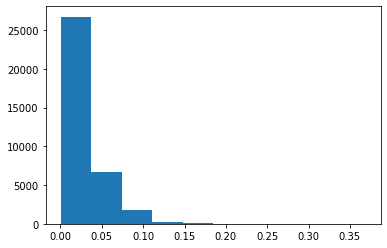

In [22]:
hist(dfs_c[0]['LCE'])
show()

In [9]:
import plotly.express as px
fig = px.scatter_3d(dfs[6], x ='x_pos', y ='z_pos', z ='y_pos', color='color')
fig.update_scenes(aspectmode='data')
fig.update_traces(opacity=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_size=1, selector=dict(type='scatter3d'))
fig.update_traces(marker_colorscale='Hot', selector=dict(type='scatter3d'))
fig.show()

In [ ]:
fig = make_subplots(
    rows=2, cols=1,
    specs=[[{}, {}],
           [{"colspan": 2}, None]],
    subplot_titles=("Control","Corner trapezoid", ))
